# Step 2) Learning, Evaluation, and Application
This notebook is the second of a pair of notebooks aiming to automate the task of vocal/instrumental segmentation of Arab Andalusian music files. It covers all steps post-feature extraction, namely the learning, the evaluation, and an example of applying the model on a full audio file. Details of each section found below

In [193]:
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD
import pandas as pd
import numpy
import essentia
import essentia.standard as estd
from pylab import plot, show, figure, imshow
import matplotlib.pyplot as plt
import copy
import mir_eval

import IPython.display as display

path_to_annot = "preprocessing/csv/"
path_to_music = "preprocessing/audio/"
path_to_intervals = "preprocessing/scripts/"

frame_dataset = 'frame_analysis.csv'
apply_dataset = 'apply_analysis.csv'

apply_file = 'apply/a025eef0-d130-496f-9581-f5ce40bd1783.wav'

## Loading Data

In [29]:
dataframe = pd.read_csv(frame_dataset)

#divide to train and test in a better way
train = dataframe.sample(frac = 0.7) 
test = dataframe.drop(train.index)

#X_train = train[train.columns.difference(['vocal'])]
X_train = train.drop(['vocal', 'start', 'end', 'mbid', 'pitch_confidence_mean', 
                      'pitch_maximum', 'pitch_mean', 'pitch_minimum', 'pitch_stddev'], axis=1)
Y_train = pd.DataFrame(train.loc[:, 'vocal'])

X_test = test.drop(['vocal', 'start', 'end', 'mbid', 'pitch_confidence_mean', 
                      'pitch_maximum', 'pitch_mean', 'pitch_minimum', 'pitch_stddev'], axis=1)

display(X_test[:5]) #displaying first 5 rows of test set
Y_test = pd.DataFrame(test.loc[:, 'vocal'])

,mfcc_0,mfcc_1,mfcc_10,mfcc_11,mfcc_12,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9
2,-967.812866,147.145782,-7.631128,-1.532532,1.885414,16.389587,-22.254040,-27.052578,-19.041374,-11.702660,-11.671997,2.449039,3.184250
3,-1022.208679,120.845131,-7.640177,0.267365,4.907707,38.465153,-9.277294,-14.633602,-10.168282,-6.577721,-0.716507,-0.396439,-7.041260
10,-898.568787,173.287689,12.082211,8.065025,-8.231731,9.136627,22.067448,1.977188,-11.800392,0.308979,-5.194977,-5.015976,-2.707062
11,-896.350952,203.003174,3.276707,18.661722,16.830559,30.158451,26.726048,33.043476,-2.774101,-7.296074,-5.068832,-7.683090,-3.120163
13,-869.729980,186.787262,-4.261051,6.217903,-0.207611,11.419159,28.880070,-5.042526,-19.586121,-19.230957,-17.987915,-0.143623,-13.157364
14,-901.899841,188.869293,-12.921309,-0.906586,9.687630,11.931366,9.439411,5.356125,-37.949078,-27.977852,-5.033920,-2.485382,-7.548500
18,-902.718567,198.321777,2.055645,-11.583031,-16.284801,1.614197,-35.492256,-11.792767,-25.338802,-29.376816,-13.444267,-1.283783,6.597704
19,-907.023071,173.152557,-3.818485,6.956024,0.945511,3.152481,-8.688396,-19.517117,-13.757561,-13.360588,-32.314636,-13.593567,-4.802177
21,-912.472595,176.384216,-9.895182,1.328087,5.346397,8.738831,12.684376,2.666840,-42.935925,-30.171776,-17.816032,-23.365387,-16.149208
23,-913.711975,183.579163,-6.935438,0.193985,2.127403,13.921844,4.507282,2.710007,-37.770962,-32.546570,-13.809357,-12.990837,-10.493225


In [166]:
print("number of training samples: {}".format(len(X_train)))

number of training samples: 47438


Number of neurons in the input layer should correspond to the number of features taken into consideration. So, this number will be calculated from the X_train number of columns.
Some open questions:
-- Give a justification for why relu is used in the first 2 layers and why sigmoid is used at the end.
-- Jusify the nepochs used.
-- and the batch size used in training


In [28]:
num_inputs = len(X_train.columns)
batchsize = int(len(X_train)/20) #to make each batch almost len/20

# create model
model = Sequential()
model.add(Dense(10, input_dim=num_inputs, activation='sigmoid'))
model.add(Dense(32, activation='sigmoid'))
model.add(Dense(1, activation='sigmoid'))

#for some reason SGD didnt work
#opt = SGD(lr=0.01)
#model.compile(loss = "categorical_crossentropy", optimizer = opt)

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train, Y_train, epochs=1000, batch_size=1000)

scores = model.evaluate(X_test, Y_test, verbose=0)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

predictions = model.predict(X_train)

rounded = [round(x[0]) for x in predictions]

Epoch 1/1000
47438/47438 [==============================] - 1s 20us/step - loss: 0.6863 - acc: 0.5451
Epoch 2/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6288 - acc: 0.6781
Epoch 3/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6284 - acc: 0.6781
Epoch 4/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6273 - acc: 0.6781
Epoch 5/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6256 - acc: 0.6781
Epoch 6/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6228 - acc: 0.6781
Epoch 7/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6174 - acc: 0.6781
Epoch 8/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6100 - acc: 0.6781
Epoch 9/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.6019 - acc: 0.6781
Epoch 10/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.5927 - 

47438/47438 [==============================] - 0s 4us/step - loss: 0.4377 - acc: 0.8050
Epoch 82/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4378 - acc: 0.8065
Epoch 83/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4375 - acc: 0.8041
Epoch 84/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4376 - acc: 0.8048
Epoch 85/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4398 - acc: 0.8048
Epoch 86/1000
47438/47438 [==============================] - 0s 4us/step - loss: 0.4375 - acc: 0.8049
Epoch 87/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4374 - acc: 0.8030
Epoch 88/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4373 - acc: 0.8047
Epoch 89/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4367 - acc: 0.8042
Epoch 90/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.4369 - acc: 0

47438/47438 [==============================] - 0s 2us/step - loss: 0.3776 - acc: 0.8470
Epoch 161/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3775 - acc: 0.8476
Epoch 162/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3780 - acc: 0.8468
Epoch 163/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3784 - acc: 0.8459
Epoch 164/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3792 - acc: 0.8465
Epoch 165/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3766 - acc: 0.8473
Epoch 166/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3778 - acc: 0.8454
Epoch 167/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3773 - acc: 0.8464
Epoch 168/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3768 - acc: 0.8468
Epoch 169/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3756

47438/47438 [==============================] - 0s 2us/step - loss: 0.3538 - acc: 0.8509
Epoch 240/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3538 - acc: 0.8498
Epoch 241/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3522 - acc: 0.8515
Epoch 242/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3514 - acc: 0.8522
Epoch 243/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3525 - acc: 0.8514
Epoch 244/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3522 - acc: 0.8502
Epoch 245/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3539 - acc: 0.8498
Epoch 246/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3527 - acc: 0.8505
Epoch 247/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3543 - acc: 0.8497
Epoch 248/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3494

47438/47438 [==============================] - 0s 2us/step - loss: 0.3383 - acc: 0.8563
Epoch 319/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3374 - acc: 0.8558
Epoch 320/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3372 - acc: 0.8566
Epoch 321/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3358 - acc: 0.8572
Epoch 322/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3355 - acc: 0.8576
Epoch 323/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3339 - acc: 0.8578
Epoch 324/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3368 - acc: 0.8576
Epoch 325/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3359 - acc: 0.8576
Epoch 326/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3347 - acc: 0.8585
Epoch 327/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3356

47438/47438 [==============================] - 0s 2us/step - loss: 0.3350 - acc: 0.8574
Epoch 398/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3345 - acc: 0.8590
Epoch 399/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3379 - acc: 0.8551
Epoch 400/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3337 - acc: 0.8590
Epoch 401/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3330 - acc: 0.8595
Epoch 402/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3346 - acc: 0.8578
Epoch 403/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3337 - acc: 0.8590
Epoch 404/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3312 - acc: 0.8604
Epoch 405/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3321 - acc: 0.8607
Epoch 406/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3354

47438/47438 [==============================] - 0s 2us/step - loss: 0.3318 - acc: 0.8598
Epoch 477/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3346 - acc: 0.8584
Epoch 478/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3337 - acc: 0.8578
Epoch 479/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3336 - acc: 0.8592
Epoch 480/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3329 - acc: 0.8596
Epoch 481/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3328 - acc: 0.8584
Epoch 482/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3352 - acc: 0.8576
Epoch 483/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3317 - acc: 0.8595
Epoch 484/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3327 - acc: 0.8595
Epoch 485/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3305

47438/47438 [==============================] - 0s 2us/step - loss: 0.3301 - acc: 0.8613
Epoch 556/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3333 - acc: 0.8584
Epoch 557/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3311 - acc: 0.8595
Epoch 558/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3310 - acc: 0.8600
Epoch 559/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3302 - acc: 0.8611
Epoch 560/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3344 - acc: 0.8573
Epoch 561/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3314 - acc: 0.8600
Epoch 562/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3387 - acc: 0.8553
Epoch 563/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3309 - acc: 0.8596
Epoch 564/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3341

47438/47438 [==============================] - 0s 2us/step - loss: 0.3303 - acc: 0.8626
Epoch 635/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3279 - acc: 0.8656
Epoch 636/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3232 - acc: 0.8684
Epoch 637/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3249 - acc: 0.8666
Epoch 638/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3226 - acc: 0.8691
Epoch 639/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3215 - acc: 0.8696
Epoch 640/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3231 - acc: 0.8686
Epoch 641/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3215 - acc: 0.8700
Epoch 642/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3233 - acc: 0.8676
Epoch 643/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3229

47438/47438 [==============================] - 0s 2us/step - loss: 0.3230 - acc: 0.8666
Epoch 714/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3231 - acc: 0.8678
Epoch 715/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3243 - acc: 0.8665
Epoch 716/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3232 - acc: 0.8671
Epoch 717/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3232 - acc: 0.8669
Epoch 718/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3221 - acc: 0.8681
Epoch 719/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3228 - acc: 0.8681
Epoch 720/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3220 - acc: 0.8686
Epoch 721/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3233 - acc: 0.8676
Epoch 722/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3236

47438/47438 [==============================] - 0s 2us/step - loss: 0.3223 - acc: 0.8689
Epoch 793/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3227 - acc: 0.8676
Epoch 794/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3229 - acc: 0.8668
Epoch 795/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3229 - acc: 0.8667
Epoch 796/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3219 - acc: 0.8674
Epoch 797/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3263 - acc: 0.8653
Epoch 798/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3214 - acc: 0.8679
Epoch 799/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3220 - acc: 0.8680
Epoch 800/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3226 - acc: 0.8672
Epoch 801/1000
47438/47438 [==============================] - 0s 2us/step - loss: 0.3245

47438/47438 [==============================] - 0s 3us/step - loss: 0.3235 - acc: 0.8676
Epoch 872/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3222 - acc: 0.8673
Epoch 873/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3209 - acc: 0.8684
Epoch 874/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3213 - acc: 0.8685
Epoch 875/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3219 - acc: 0.8686
Epoch 876/1000
47438/47438 [==============================] - 0s 4us/step - loss: 0.3233 - acc: 0.8666
Epoch 877/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3226 - acc: 0.8675
Epoch 878/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3213 - acc: 0.8676
Epoch 879/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3226 - acc: 0.8672
Epoch 880/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3217

47438/47438 [==============================] - 0s 4us/step - loss: 0.3216 - acc: 0.8677
Epoch 951/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3198 - acc: 0.8692
Epoch 952/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3211 - acc: 0.8686
Epoch 953/1000
47438/47438 [==============================] - 0s 4us/step - loss: 0.3233 - acc: 0.8664
Epoch 954/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3208 - acc: 0.8697
Epoch 955/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3245 - acc: 0.8660
Epoch 956/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3231 - acc: 0.8668
Epoch 957/1000
47438/47438 [==============================] - 0s 4us/step - loss: 0.3221 - acc: 0.8677
Epoch 958/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3202 - acc: 0.8688
Epoch 959/1000
47438/47438 [==============================] - 0s 3us/step - loss: 0.3213

## Evaluation
In order to fullfil standard evaluation criteria, mir_eval toolkit will be used to generate task statistics. This task is a segmentation task, and therefore the mir_eval.segmentation module will be used.


In [213]:
#to avoid incompatibility problems, the training and estimated labels will be put in 3 column files and read
#for the evaluation calc.
def frame_to_s(frame, sampling_rate=44100.0):
    return float(frame)/float(sampling_rate)

start = pd.Series(test.loc[:, 'start']).reset_index(drop=True)
end = pd.Series(test.loc[:, 'end']).reset_index(drop=True)
ref_labels = pd.Series(test.loc[:, 'vocal']).reset_index(drop=True)

start_s = start.apply(frame_to_s)
end_s = end.map(frame_to_s)

result = pd.Series(rounded, name='vocal')

intervals_only_test = pd.concat([start_s, end_s, ref_labels], axis=1)
intervals_only_predictions = pd.concat([start_s, end_s, result], axis=1)

#writing to temp files
intervals_only_test.to_csv('ref.csv', header=None, index=False)
intervals_only_predictions.to_csv('est.csv', header=None,index=False)

(ref_intervals, ref_labels) = mir_eval.io.load_labeled_intervals('ref.csv', delimiter=',')
(est_intervals, est_labels) = mir_eval.io.load_labeled_intervals('est.csv', delimiter=',')

scores = mir_eval.segment.evaluate(ref_intervals, ref_labels, est_intervals, est_labels)


In [216]:
print(scores)

OrderedDict([('Precision@0.5', 1.0), ('Recall@0.5', 1.0), ('F-measure@0.5', 1.0), ('Precision@3.0', 1.0), ('Recall@3.0', 1.0), ('F-measure@3.0', 1.0), ('Ref-to-est deviation', 0.0), ('Est-to-ref deviation', 0.0), ('Pairwise Precision', 0.7034060693195672), ('Pairwise Recall', 0.9131335311194612), ('Pairwise F-measure', 0.7946649345480885), ('Rand Index', 0.8379879297533815), ('Adjusted Rand Index', 0.6645585155532225), ('Mutual Information', 0.7905427654804207), ('Adjusted Mutual Information', 0.6843713676376397), ('Normalized Mutual Information', 0.7462246305231239), ('NCE Over', 0.887483339564791), ('NCE Under', 0.7370458121023802), ('NCE F-measure', 0.8052990345732832), ('V Precision', 0.8136241897734237), ('V Recall', 0.6844083622371705), ('V-measure', 0.7434433897340778)])


## Applying Model on New file

To make a more practical sense of the results, we will use a full audio file audio so that no frames are skipped. This is because in the annotated dataset which is used for test/train, the annotated fragments are shuffled such that the test dataset does not consist of contiguous frames. Therefore, creating audio files with vocal only/instrumental only will not work using the test set. Since this portion is not about quantifying the results, a non-annotated audio file will be used. Feature extraction of this .wav file was conducted in the Step 1) notebook. This regeneration can be applied to the files used for training and testing combined for us to have contiguous audio regeneration, but in that case it would only be used as a mixed metric that includes the train error + test error combined, so was not conducted here.
The regeneration function can regenerate several mbids at the same time. Audio dict must be populated accordingly

In [179]:
#prediction
apply_frames = pd.read_csv(apply_dataset)
apply_frames_features = apply_frames.drop(['start', 'end', 'mbid', 'pitch_confidence_mean', 
                      'pitch_maximum', 'pitch_mean', 'pitch_minimum', 'pitch_stddev'], axis=1)

prediction_set = apply_frames_features 
prediction_results = model.predict(prediction_set)

rounded = [round(x[0]) for x in prediction_results]

#X_test is just test with a few columns dropped.
#So, the indexes are the same
intervals = pd.DataFrame(apply_frames.loc[:, ['start', 'end', 'mbid']])
loader = estd.MonoLoader(filename=path_to_music + apply_file)

audio_dict['a025eef0-d130-496f-9581-f5ce40bd1783'] = loader()

In [180]:
#intervals: intervals in frames wrt to the relevant audio file. dataframe
#predictions: dataframe of index number with prediction result
#audio_dict: dictionary with audio
#n_window: window for discarding prediction anomalies.

def regenerate_audios(intervals, predictions, audio_dict, n_window): 
    mbids = intervals.mbid.unique()
    vocal_audio = {} #holds all the vocal regenerated audio
    instrumental_audio = {}
    
    for mbid in mbids:
        vocal_audio[mbid] = copy.deepcopy(audio_dict[mbid])
        instrumental_audio[mbid] = copy.deepcopy(audio_dict[mbid])
        
    for i, p in enumerate(predictions):
        row = intervals.iloc[i]
        start = row['start']
        end = row['end']
        mbid = row['mbid']
        #overwrite the frames with whatever values are necessary
        if p == 0: #instrumental
            for j in range(start, end):
                vocal_audio[mbid][j] = 0
        else: #vocal
            for j in range(start, end):
                instrumental_audio[mbid][j] = 0
    return vocal_audio, instrumental_audio

#we might want to pass a windowing function, or simplement it in regenerate_audio and vary the window size/ see the effect 
#on the overall audio result

In [181]:
#display(X_test[:10])
#display(predictions[:10])

n_window = 0
vocal_audio, instrumental_audio = regenerate_audios(intervals, rounded, audio_dict, n_window)

In [182]:
for i in range(0, 10):
    print("df: {}, prediction : {}".format(X_test.iloc[i, 0], predictions[i]))

df: -967.8128662109376, prediction : [0.8044766]
df: -1022.2086791992188, prediction : [0.85393965]
df: -898.5687866210938, prediction : [0.5437148]
df: -896.3509521484375, prediction : [0.99105775]
df: -869.72998046875, prediction : [0.8577106]
df: -901.8998413085938, prediction : [0.23400223]
df: -902.7185668945312, prediction : [0.8664185]
df: -907.0230712890624, prediction : [0.14888802]
df: -912.4725952148438, prediction : [0.9956362]
df: -913.7119750976562, prediction : [0.8064703]


In [183]:
def plot_wavs(audio, start_time_s, end_time_s, label):   
    plt.figure(figsize=(15, 6))
    plt.title(label)
    plot(audio[start_time_s*44100:end_time_s*44100])
    show()

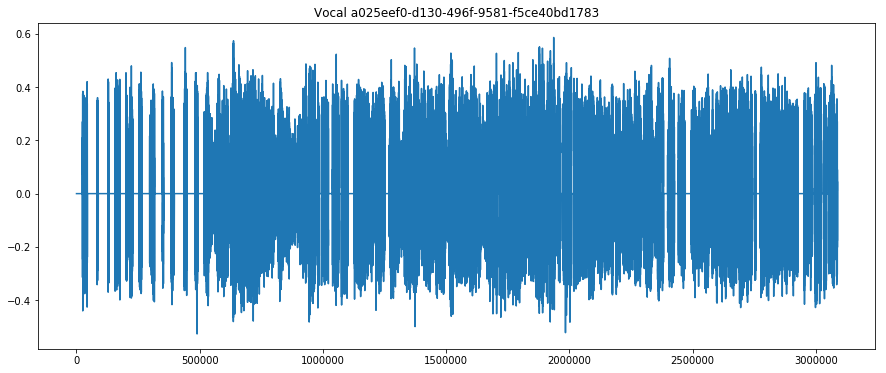

In [191]:
#instrumental_audio['8842c1f0-e261-4069-bd59-768bb9a3315c']
start_time_s = 450
end_time_s = 520
plot_wavs(vocal_audio['a025eef0-d130-496f-9581-f5ce40bd1783'], 
         start_time_s, end_time_s, 'Vocal a025eef0-d130-496f-9581-f5ce40bd1783')
display.Audio(vocal_audio['a025eef0-d130-496f-9581-f5ce40bd1783'][start_time_s*44100:end_time_s*44100], rate=44100)

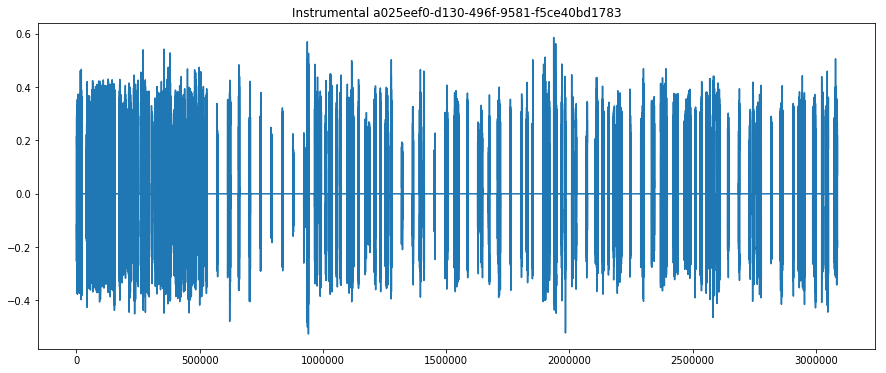

In [192]:
plot_wavs(instrumental_audio['a025eef0-d130-496f-9581-f5ce40bd1783'], 
         start_time_s, end_time_s, 'Instrumental a025eef0-d130-496f-9581-f5ce40bd1783')
display.Audio(instrumental_audio['a025eef0-d130-496f-9581-f5ce40bd1783'][start_time_s*44100:end_time_s*44100], rate=44100)

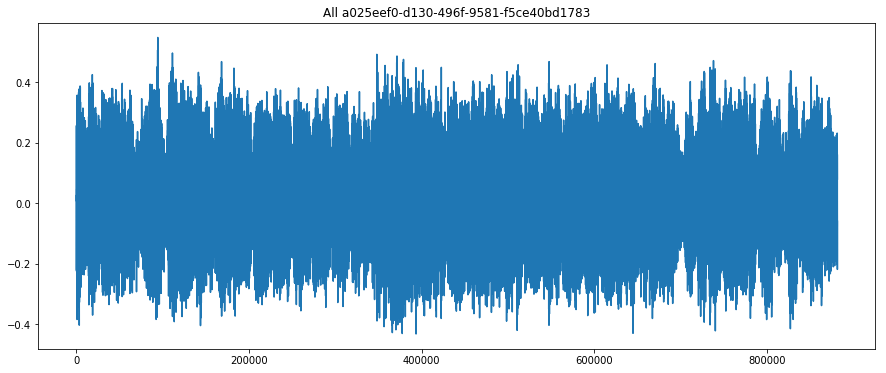

In [189]:
plot_wavs(audio_dict['a025eef0-d130-496f-9581-f5ce40bd1783'], 
         start_time_s, end_time_s, 'All a025eef0-d130-496f-9581-f5ce40bd1783')
display.Audio(audio_dict['a025eef0-d130-496f-9581-f5ce40bd1783'][start_time_s*44100:end_time_s*44100], rate=44100)